## Importing

### functions

In [1]:
from IPython.core.display import HTML,display
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import pandas as pd
import numpy as np
np.corrcoef([0,1], [0,2])
import bioformats as bf
import os
import islets
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
from scipy.stats import distributions as dst

plt.rcParams["animation.embed_limit"] = 200

In [4]:
from islets.utils import multi_map
from copy import deepcopy
from scipy.stats import median_abs_deviation

### Import pickle

In [5]:
# from islets import PicklePicker
# pp = PicklePicker("/data/Sandra/2019/2019_11_11/Experiment40a.lif",)
# pp.show()

# pathToPickle = "/data/Sandra/2019/2019_11_11/Experiment40b.lif_analysis/Series008-9/3.4_rois.pkl" ## very stable
pathToPickle = "/data/Sandra/2020/2020_05_29/Experiment51b.lif_analysis/Series008-9_0-2700s/6.7_rois.pkl"
regions = islets.load_regions(pathToPickle, calcInterest=False, plot=False, baremin=True)

### merge some of the rois

In [6]:
# save original pickle to compare later
regions0 = deepcopy(regions)

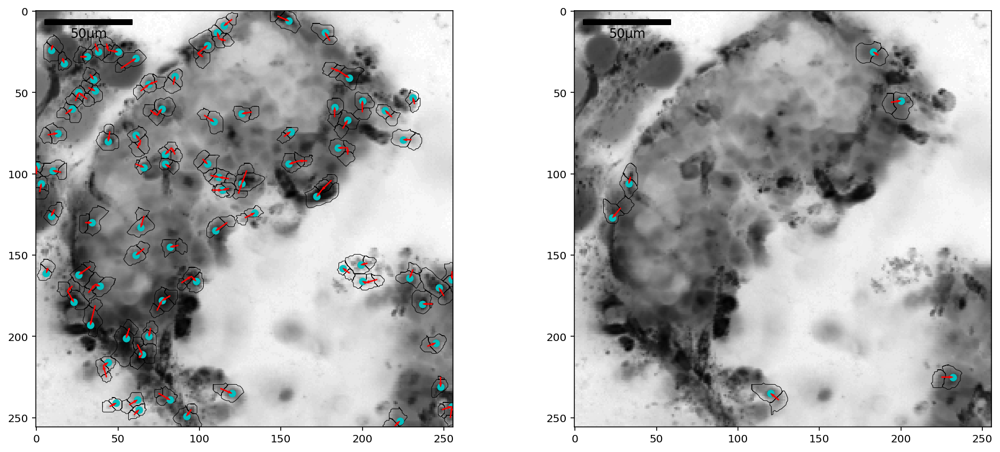

In [7]:
regions.merge_closest(plot=True, mergeDist=2, mergeSizeTh = 50)

Compare what we merged

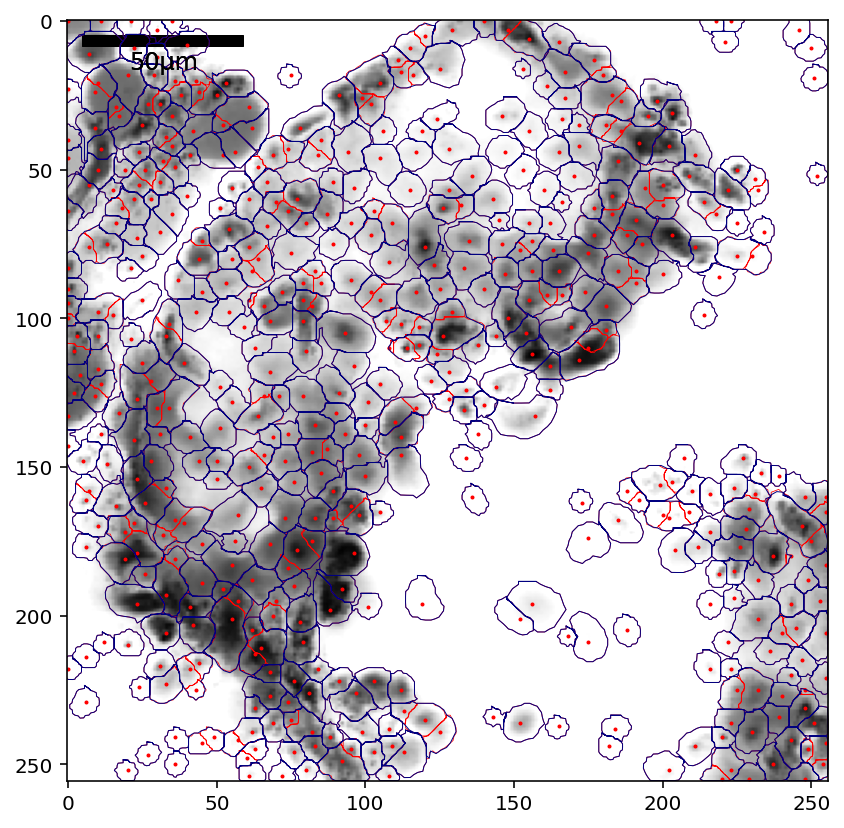

In [8]:
plt.figure(figsize=(7,7))
ax = plt.subplot(111)
regions0.plotEdges(ax=ax,color="r",lw=.4)
regions0.plotPeaks(ax=ax,color="r")
regions.plotEdges(ax=ax, image=False, color="navy")

In [9]:
# regions0.examine(startShow=sum([regions0.df.loc[i,"neighbors"] for i in np.setdiff1d(regions0.df.index, regions.df.index)],[]))

In [10]:
print("previously: \t", len(regions0.df))
print("post-merging: \t", len(regions.df))


previously: 	 521
post-merging: 	 413


If we are happy, we can free the original pickle from the memory

In [11]:
del regions0

## Filter rois

### get rid of the very faint rois

In [12]:
regions.reassign_peaks(regions.statImages["mean"])

Text(0.5, 0, 'log10 (mean brightness)')

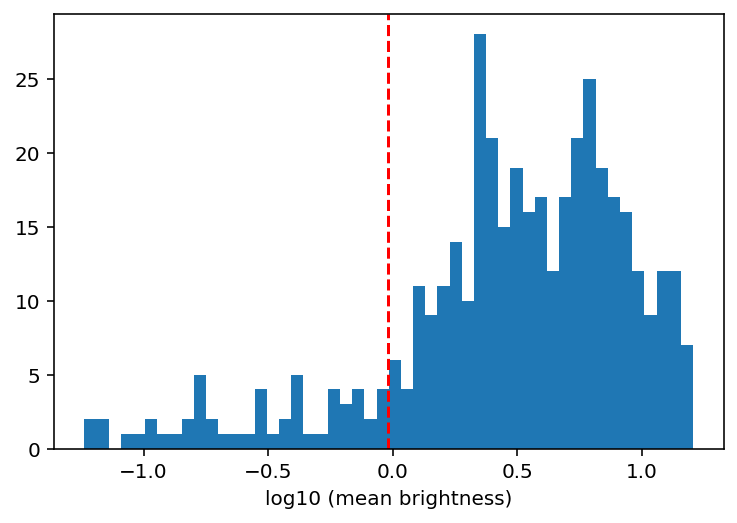

In [13]:
x = np.log10(regions.df.peakValue)
plt.hist(x,50);
xmed = np.median(x)
xlowth = xmed-2*median_abs_deviation(x)
plt.axvline(xlowth,color="red",ls="--")
low_mean_light_ix = regions.df.index[x<xlowth]
plt.xlabel("log10 (mean brightness)")

In [14]:
regions.detrend_traces(method="simple")

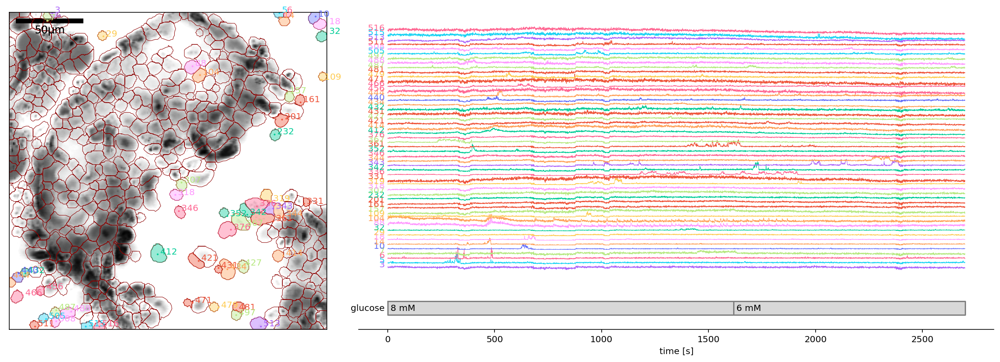

In [15]:
regions.plotTraces(low_mean_light_ix)

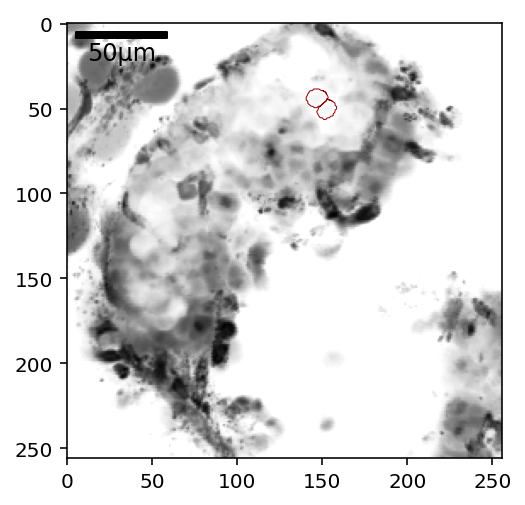

In [16]:
# there are two rois in the islet which I do not want to throw out: 
saverois = [104, 88]
regions.plotEdges(saverois)

In [17]:
low_mean_light_ix = np.setdiff1d(low_mean_light_ix, saverois)

In [18]:
regions.df.drop(index=low_mean_light_ix, inplace=True)
regions.update()

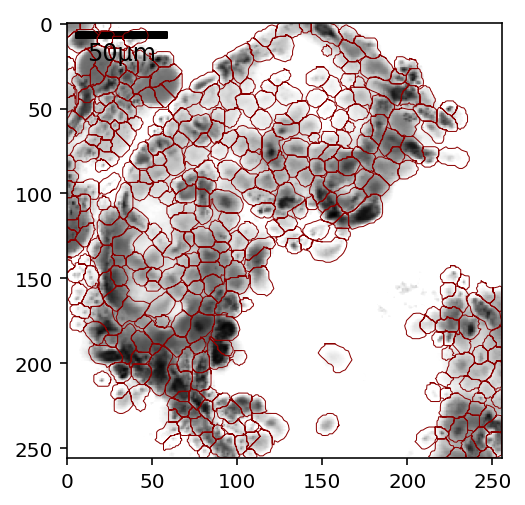

In [19]:
regions.plotEdges()

### Inspect rois which are funny w.r.t. their errors

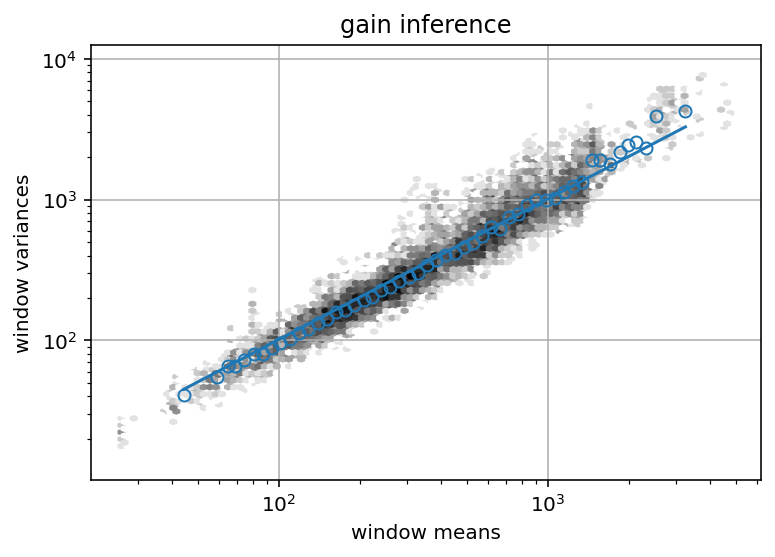

In [20]:
# but first infer gain
regions.infer_gain(plot=True)

In [21]:
regions.gain

1.013568674643957

In [22]:
zcorrs = []
# tiny timescale which should contain very few events
ts = .4
z = regions.fast_filter_traces(ts, z_sp=0, write=False)[-1]
zcorrs += [median_abs_deviation(z, scale="normal", axis=1)]
zcorrs = np.array(zcorrs)
regions.df["correctZ"] = zcorrs[np.argmin(np.abs(zcorrs-1),0),np.arange(zcorrs.shape[1])]

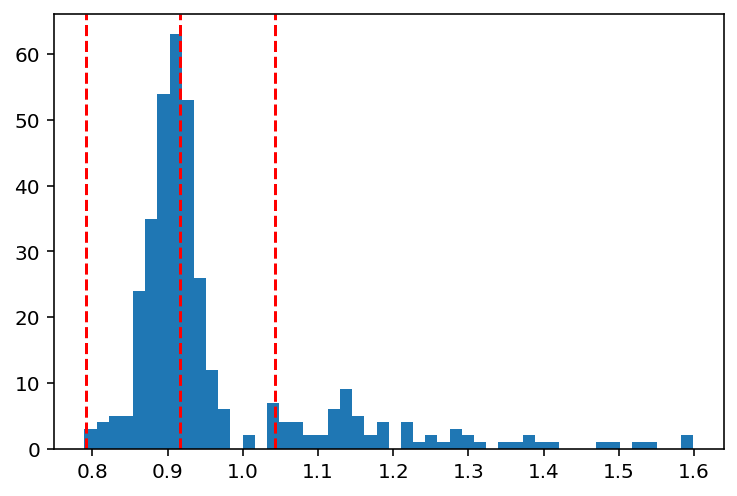

In [23]:
plt.hist(regions.df.correctZ,50);
plt.axvline(regions.df.correctZ.median(), color="red", ls="--")
corrZ_highth = regions.df.correctZ.median()+3*median_abs_deviation(regions.df.correctZ, scale="normal")
corrZ_lowth = regions.df.correctZ.median()-3*median_abs_deviation(regions.df.correctZ, scale="normal")
plt.axvline(corrZ_highth, color="red", ls="--")
plt.axvline(corrZ_lowth, color="red", ls="--")

In [24]:
toohigh = regions.df.query(f"correctZ>{corrZ_highth}").sort_values("correctZ").index
toolow  = regions.df.query(f"correctZ<{corrZ_lowth}" ).sort_values("correctZ").index

very high std @ short timescale


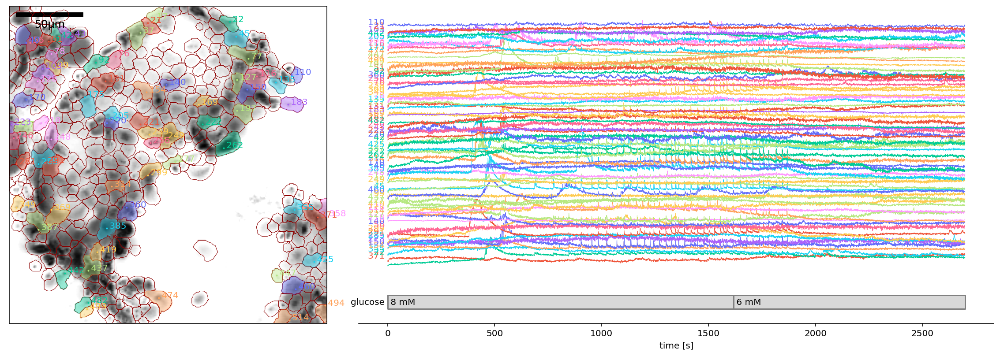

In [25]:
if len(toohigh):
    print ("very high std @ short timescale")
    regions.plotTraces(toohigh, Offset=1)

very low std @ short timescale


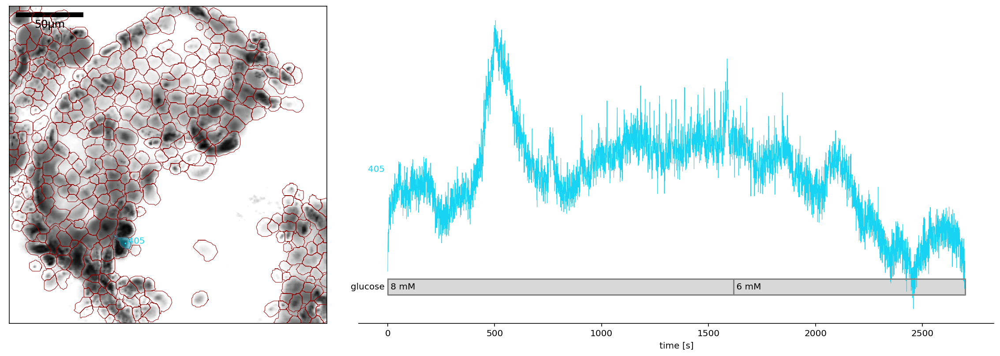

In [26]:
if len(toolow):
    print ("very low std @ short timescale")
    regions.plotTraces(toolow, Offset=1)

I do not see anything funny here.

In [27]:
# regions.df.drop(index=toolow, inplace=True)
# regions.update()
# regions.df.drop(index=toohigh, inplace=True)
# regions.update()

## Analyze spikes

### Perform filtering at sequential timescales

In [28]:
timescales = 2.**np.arange(-1,20)
timescales = timescales[timescales<regions.time[-1]/5]
print("timescales:","  ".join(["%g"%ts for ts in timescales]))

timescales: 0.5  1  2  4  8  16  32  64  128  256  512


In [29]:
smooth = None
z_sp = 0
z_th = 3

In [30]:
%matplotlib inline
allSpikes = []
for its, ts in enumerate(timescales):
    k = "%g"%ts
    print ("#"*30+f"\t ts = {ts}s")
    regions.fast_filter_traces(ts, z_sp=z_sp, verbose=True,Npoints=np.inf)
    regions.df["zScore_"+k] = [regions.df.loc[ix,"zScore_"+k]/regions.df.loc[ix,"correctZ"] for ix in regions.df.index]
    regions.calc_spikes(ts,z_th=z_th, smooth=smooth, verbose=True)
    spikeDF = regions.spikes[k]
    spikeDF = spikeDF.query(f"halfwidth<{ts*.7}")
    spikeDF["ts"] = ts
    spikeDF["its"] = its
    for ttmp in allSpikes:
        spikeDF.index += len(ttmp.index)
    allSpikes += [spikeDF]

##############################	 ts = 0.5s
Nrebin = 1
##############################	 ts = 1.0s
Nrebin = 1
smoothing with kernel 3
##############################	 ts = 2.0s
Nrebin = 1
smoothing with kernel 7
##############################	 ts = 4.0s
Nrebin = 1
smoothing with kernel 15
##############################	 ts = 8.0s
Nrebin = 1
smoothing with kernel 31
##############################	 ts = 16.0s
Nrebin = 1
smoothing with kernel 63
##############################	 ts = 32.0s
Nrebin = 1
smoothing with kernel 127
##############################	 ts = 64.0s
Nrebin = 1
smoothing with kernel 253
##############################	 ts = 128.0s
Nrebin = 1
smoothing with kernel 507
##############################	 ts = 256.0s
Nrebin = 1
smoothing with kernel 1013
##############################	 ts = 512.0s
Nrebin = 1
smoothing with kernel 2027


### Collect spikes

In [31]:
allSpikes = pd.concat(allSpikes[:])
allSpikes["loghalfwidth"] = np.log10(allSpikes["halfwidth"])

In [32]:
allSpikes["color"] = list(plt.cm.hot(islets.utils.coltrans(allSpikes.height, vmax=10)))
allSpikes["logheight"] = np.log10(allSpikes.height)
allSpikes["tend"] = allSpikes["t0"]+ allSpikes["halfwidth"]

In [33]:
# ax = plt.subplot(111)
# ax.set_facecolor("k")
# y = islets.utils.coltrans(allSpikes.height, vmax=10)
# plt.scatter(allSpikes.height, y,c = allSpikes.color,s=4, )
# # plt.xscale("log")
# plt.xlabel("height [z-score]")

In [37]:
# if we want to have a look at all the inferred spikes (many are probably inferred more than once)
showdf = allSpikes
regions.examine_spikesdf(showdf.query(f"roi==402"),cols=["loghalfwidth","height"])

In [38]:
nSpikes = allSpikes.groupby("roi").apply(len)

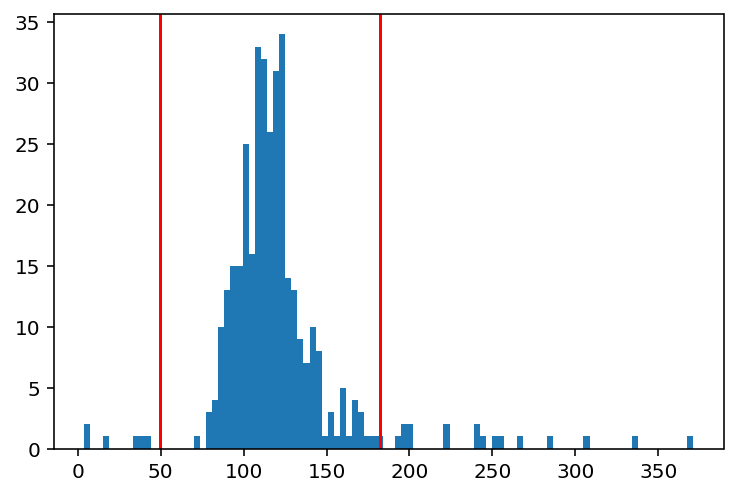

In [39]:
plt.hist(nSpikes,100);
nSpike_lowth  = nSpikes.median()-3*nSpikes.mad()
nSpike_highth = nSpikes.median()+3*nSpikes.mad()
plt.axvline(nSpike_lowth,color="red")
plt.axvline(nSpike_highth,color="red")

In [40]:
tooFewSpikes = nSpikes[nSpikes<nSpike_lowth].index

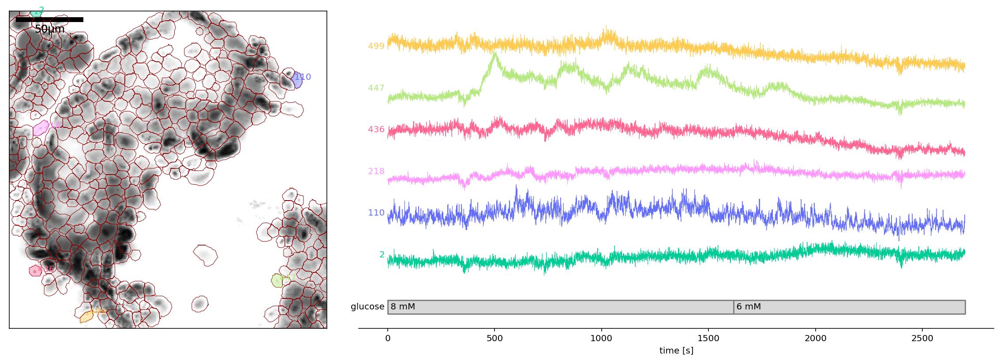

In [41]:
regions.plotTraces(tooFewSpikes)

In [42]:
regions.df.drop(index=tooFewSpikes, inplace=True)
regions.update()

In [43]:
manySpikes = nSpikes[nSpikes>nSpike_highth].index

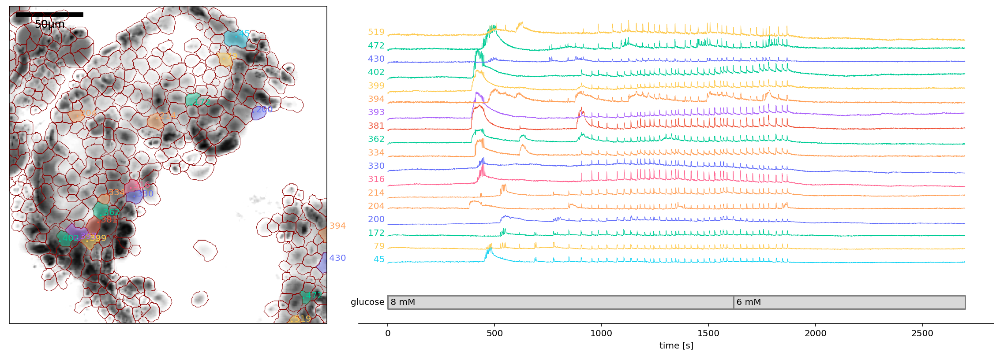

In [44]:
regions.plotTraces(manySpikes)

### Process single roi

In [45]:
%matplotlib notebook

<IPython.core.display.Javascript object>


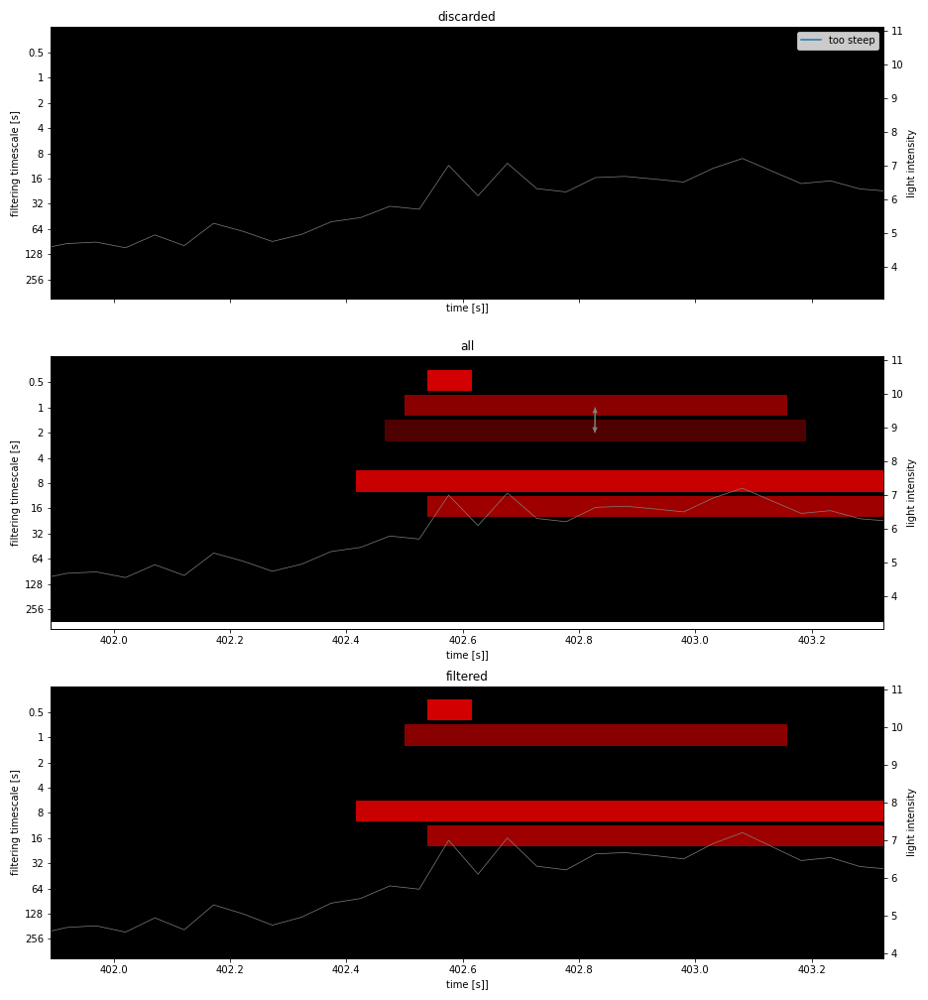

In [48]:
roi = 402

xl = 0,regions.time[-1]
# xl = 400,600
df = allSpikes.query(f"roi=={roi} and t0>{xl[0]} and t0<{xl[1]}").copy()
df_filt,axs = islets.utils.filter_spikes_per_roi(df,regions,plot=True,freqShow=regions.Freq)

### Process all rois

In [130]:
from tqdm.notebook import tqdm
tqdm().pandas()

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/tqdm/std.py:699: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [134]:
DF_filt = []
for roi in tqdm(regions.df.index):
    df_filt = islets.utils.filter_spikes_per_roi(allSpikes.query(f"roi=={roi}"),regions)[0]
    df_filt["roi"] = roi
    DF_filt += [df_filt]

In [135]:
DF_filt = pd.concat(DF_filt)

In [136]:
DF_filt.shape

(39586, 9)

### analyze surviving spikes

In [147]:
regions.df["spike number"] = [(DF_filt.roi==roi).sum() for roi in regions.df.index]

In [149]:
%matplotlib inline

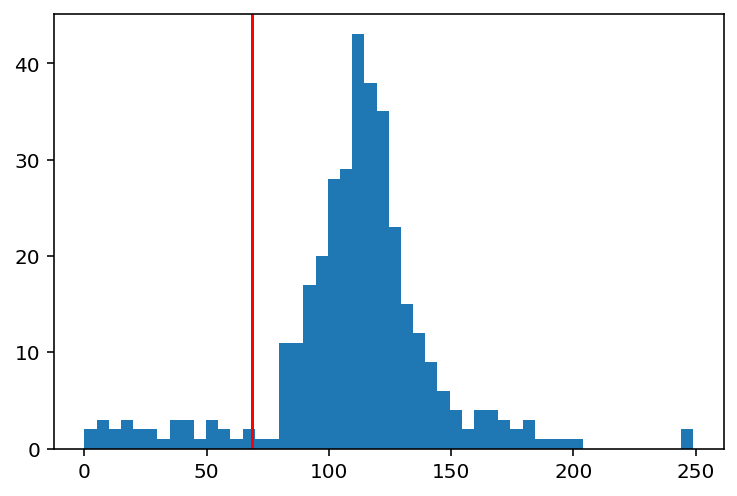

In [152]:
plt.hist(regions.df["spike number"],50);
Nspike_th = regions.df["spike number"].median()-2*regions.df["spike number"].mad()
plt.axvline(Nspike_th,color="red")

In [153]:
poorRois = regions.df.index[regions.df["spike number"]<Nspike_th]

In [157]:
poorRois = regions.df["spike number"][poorRois].sort_values().index

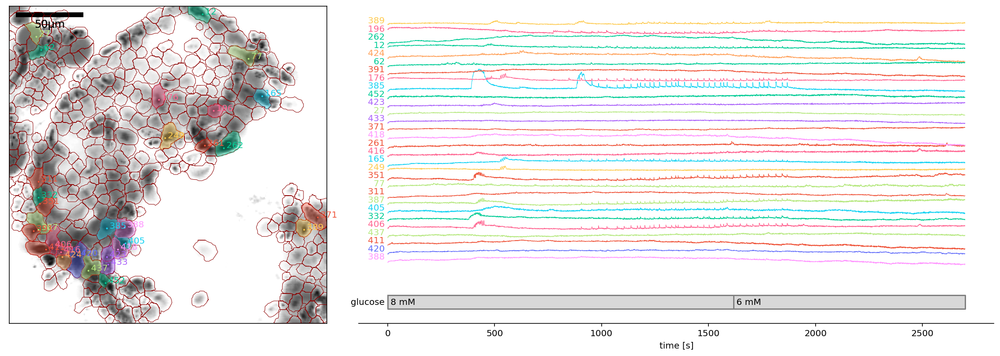

In [158]:
# seem there are rois which have no spike now
# let's check them explicitly
regions.plotTraces(poorRois[:10])

So only the first 4 look like nothing by eye

In [161]:
poorRois = poorRois[:4]

In [202]:
DF_filt["log10 halfwidth"] = np.log10(DF_filt.halfwidth)

In [203]:
regions.examine_spikesdf(DF_filt, cols=["log10 halfwidth","height"])

### Eye candy (to be)

<IPython.core.display.Javascript object>


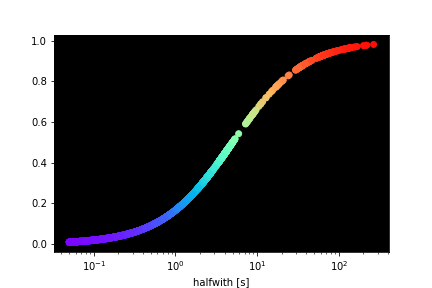

Text(0.5, 0, 'halfwith [s]')

In [218]:
plt.figure()
ax = plt.subplot(111)
ax.set_facecolor("k")
x = DF_filt.halfwidth.values
y = islets.utils.coltrans(x,vmax=30)
xc = 5
h = 1
y = (x/xc)**h/(1+(x/xc)**h)
DF_filt["coltrans"] = y
c = list(plt.cm.rainbow(y))
plt.scatter(x,y,
    c = c
)
DF_filt["color"] = c
plt.xscale("log")
plt.xlabel("halfwith [s]")

In [219]:
%matplotlib notebook

<IPython.core.display.Javascript object>


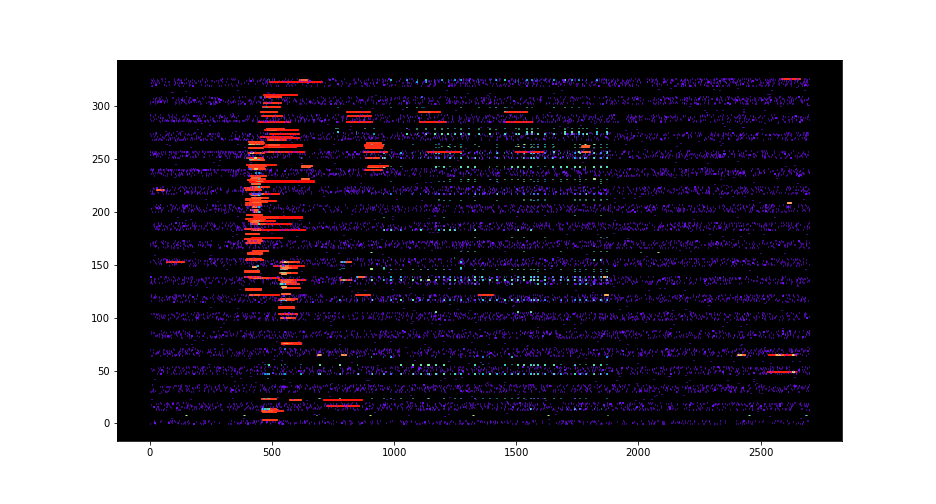

In [222]:
plt.figure(figsize=(13,7))
ax = plt.subplot(111)
i = 0
for roi in regions.df.index[regions.df["spike number"]>Nspike_th]:
#     if roi>200: continue
    df_filt = DF_filt.query(f"roi=={roi}")
    for _,row in df_filt.sort_values("halfwidth", ascending=False).iterrows():
#         if row.t0<1000: continue
#         if row.t0>1500: continue
        h = (row.coltrans+.7)/1.7
        ax.fill(
            row.t0+row.halfwidth*np.array([0,0,1,1,0]),
            (np.array([0,1,1,0,0])-.5)*h+i,
            color=row.color,
#             linewidth=.7,
#             edgecolor="k"
        )
    i += 1
#     break
ax.set_facecolor("k")

### Check some of the rois at the lower side

In [178]:
%matplotlib notebook

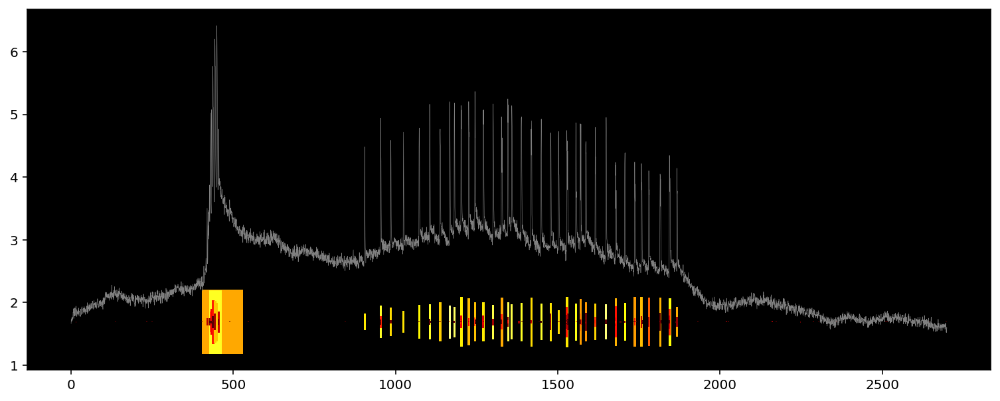

In [204]:
nr = 10
for roi in regions.df["spike number"].sort_values().index[-1:]:
    fig, ax = plt.subplots(1,1,figsize=(13,5))
    x, y = regions.time, regions.df.loc[roi, "trace" ]
    x = islets.numeric.rebin(x,nr)
    y = islets.numeric.rebin(y,nr)
    ax.plot(x,y,c="grey", lw=.3)
    df_filt = DF_filt.query(f"roi=={roi}")
    for ix,row in df_filt.sort_values("halfwidth", ascending=False).iterrows():
            ax.fill(
                row.t0+row.halfwidth*np.array([0,0,1,1,0]),
                -(-.5+np.array([0,1,1,0,0]))*row.coltrans+np.percentile(y,5),
                color=row.color,
    #             linewidth=.7,
    #             edgecolor="k"
            )
    ax.set_facecolor("k")